In [4]:
import pandas as pd
import requests
from collections import defaultdict
import json

from accessibility import check_endpoint

### OGC sensorthings API

In [5]:
# analysed endpoint:
argo_url = "https://sextant.ifremer.fr/examind/WS/sts/coriolis/v1.1" 

# explore sparql endpoint: Endpoint https://sparql.ifremer.fr/sextant_seadatanet/query={?query}
# serviceEndpoint: https://sparql.ifremer.fr/sextant_seadatanet/query=
# alias ~ seadatanet domains 

In [6]:
if check_endpoint(argo_url, 'json_api'):
    print("The endpoint is machine-accessible.")
else:
    print("The endpoint is not machine-accessible.")

Checking endpoint: https://sextant.ifremer.fr/examind/WS/sts/coriolis/v1.1
Endpoint is online: 200
Content type suggests machine-readable data: application/json
Failed to access API endpoint: 404
The endpoint is not machine-accessible.


### Analysis results:

- data findable & accessible: 
    - endpoint is a json API,
    - machine accessible but requires knowledge on API structure/model 
    - not all metadata links acessible (see further)

- data granularity goes to data point level
  - single observations are described 

- semantics of metadata 
  - use of standard terms (~ semantic ambiguity), but limited
    - Sensors entity: 'encoding type' field is url (e.g. "http://www.opengis.net/doc/IS/SensorML/2.0")
      but Locations entity: 'encoding type' field is standard term but string
    - ObservedProperties entity: no link to external definitions (definition field itself is a code number/ID)
    - Observations entity: 'result' field -> not clear, result of what? 
    - FeatureOfInterest entity: name is a code --> refers to location where observation was made; --> results in semantic ambiguity for 'result' property of Observations entity (e.g. https://sextant.ifremer.fr/examind/WS/sts/coriolis/v1.1/FeaturesOfInterest(61795678), https://docs.ogc.org/is/18-088/18-088.html#featureofinterest
    - Sensors entity: 'metadata' field has url "https://sextant.ifremer.fr/examind" --> unaccessible 
  - properties field with user-annotated properties (~ semantic ambiguity)
  - limited alignment with other standards,vocabs,... 
  
- interoperability: 
    - following the O&M 2.0 standard,IOT-T definition (figure: https://docs.ogc.org/is/18-088/18-088.html#fig-sensing-entities)
    - requires getting to know this standard in order to understand the semantics of the data
  
(sidenotes: @iot.selflink returns 404 - not available - due to missing ')' at end of url)

A typical 'OGC SensorThings' API has following properties:
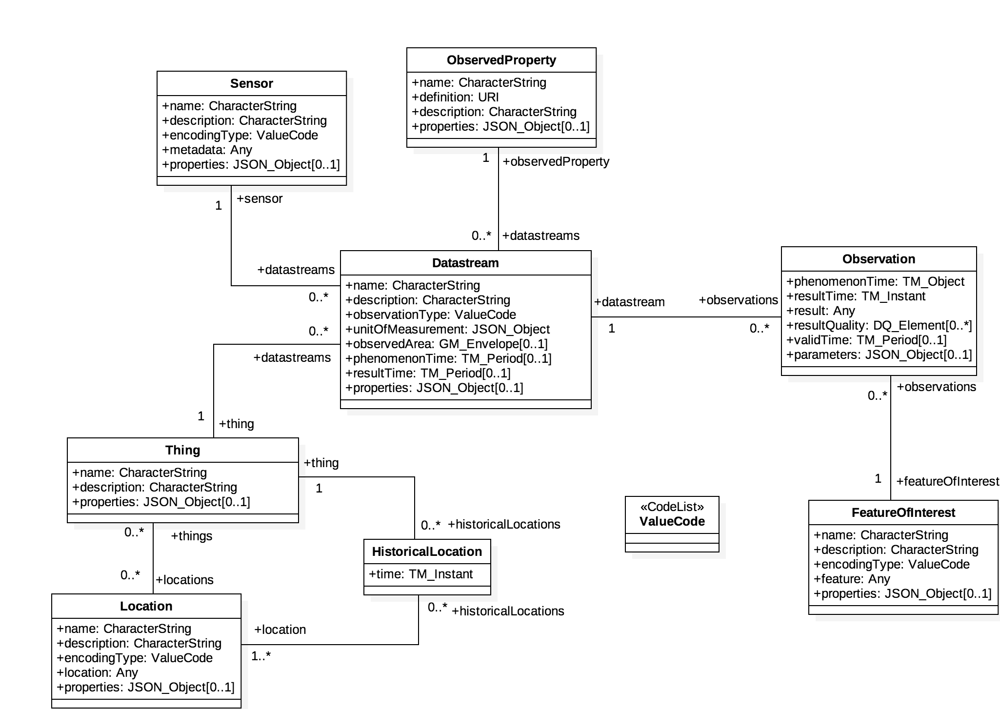

The ARGO SensorThings API is implemented as follows:

![image.png](images/ARGO_SensorThingsAPI.drawio.png)

In [3]:
endpoint_response = requests.get(argo_url).json()

print(f"number of entities described: {len( endpoint_response['value'])}")
entity_names = []
entity_urls = []
for item in endpoint_response['value']:
    item_list = list(item.values())
    entity_names.append(item_list[0])
    entity_urls.append(item_list[-1])
    
    print(f'{item_list[0]}: {item_list[-1]}')


number of entities described: 9
Things: https://sextant.ifremer.fr/examind/WS/sts/coriolis/v1.1/Things
Locations: https://sextant.ifremer.fr/examind/WS/sts/coriolis/v1.1/Locations
Datastreams: https://sextant.ifremer.fr/examind/WS/sts/coriolis/v1.1/Datastreams
MultiDatastreams: https://sextant.ifremer.fr/examind/WS/sts/coriolis/v1.1/MultiDatastreams
Sensors: https://sextant.ifremer.fr/examind/WS/sts/coriolis/v1.1/Sensors
Observations: https://sextant.ifremer.fr/examind/WS/sts/coriolis/v1.1/Observations
ObservedProperties: https://sextant.ifremer.fr/examind/WS/sts/coriolis/v1.1/ObservedProperties
FeaturesOfInterest: https://sextant.ifremer.fr/examind/WS/sts/coriolis/v1.1/FeaturesOfInterest
HistoricalLocations: https://sextant.ifremer.fr/examind/WS/sts/coriolis/v1.1/HistoricalLocations


In [4]:
#Helper function
def summarize_json_keys(data, summary=None, parent_key=""):
    """
    Recursively summarizes all keys in a JSON object.

    :param data: The JSON data (as a Python dictionary or list).
    :param summary: A dictionary to store the summary of keys (default: None).
    :param parent_key: A string representing the parent key (for nested keys).
    :return: A dictionary summarizing the occurrence and types of all keys.
    """
    if summary is None:
        summary = defaultdict(lambda: {"count": 0, "types": set(), "example": ""})

    if isinstance(data, dict):
        for key, value in data.items():
            # Create a full key path for nested keys
            full_key = f"{parent_key}.{key}" if parent_key else key
            summary[full_key]["count"] += 1
            summary[full_key]["types"].add(type(value).__name__)
            summary[full_key]["example"] = value
            summarize_json_keys(value, summary, full_key)

    elif isinstance(data, list):
        for item in data:
            summarize_json_keys(item, summary, parent_key)

    return summary

In [5]:
# Things URL
things_url = "https://sextant.ifremer.fr/examind/WS/sts/coriolis/v1.1/Things"

# Initialize the summary dictionary
summary = defaultdict(lambda: {"count": 0, "types": set()})

# Fetch data and summarize keys across all pages
while things_url:
    response = requests.get(things_url)
    json_data = response.json()

    # Update the summary with the current page's data
    summary = summarize_json_keys(json_data, summary)

    # Update the URL to the next page
    things_url = json_data.get("@iot.nextLink")

# Display the summary of all keys
for key, info in summary.items():
    print(f"Key: {key}, Count: {info['count']}, Types: {', '.join(info['types'])}, Example value: '{info['example']}'")

# Convert the summary dictionary to a pandas DataFrame
df_summary = pd.DataFrame([
    {
        "Property": key,
        "Count": info["count"],
        "Types": ', '.join(info["types"]),
        "Example": info["example"]
    }
    for key, info in summary.items()
])
# and save properties to csv file
df_summary.to_csv("properties/ARGO_OGCSensorThingsAPI_metadata_things.csv", index=False)

df_summary

Key: value, Count: 33, Types: list, Example value: '[{'name': 'TAUSALA SAMOA', 'description': '', 'properties': {'type': 'Profile'}, '@iot.id': 'V2FA2', '@iot.selfLink': 'https://sextant.ifremer.fr/examind/WS/sts/coriolis/v1.1/Things(V2FA2)', 'HistoricalLocations@iot.navigationLink': 'https://sextant.ifremer.fr/examind/WS/sts/coriolis/v1.1/Things(V2FA2)/HistoricalLocations', 'Datastreams@iot.navigationLink': 'https://sextant.ifremer.fr/examind/WS/sts/coriolis/v1.1/Things(V2FA2)/Datastreams', 'Locations@iot.navigationLink': 'https://sextant.ifremer.fr/examind/WS/sts/coriolis/v1.1/Things(V2FA2)/Locations', 'MultiDatastreams@iot.navigationLink': 'https://sextant.ifremer.fr/examind/WS/sts/coriolis/v1.1/Things(V2FA2)/MultiDatastreams'}, {'name': 'REYKJAFOSS', 'description': '', 'properties': {'type': 'Profile'}, '@iot.id': 'V2FB6', '@iot.selfLink': 'https://sextant.ifremer.fr/examind/WS/sts/coriolis/v1.1/Things(V2FB6)', 'HistoricalLocations@iot.navigationLink': 'https://sextant.ifremer.fr/e

,Property,Count,Types,Example
0,value,33,list,"[{'name': 'TAUSALA SAMOA', 'description': '', ..."
1,value.name,32495,str,MSC CHILE (Call Signal ELZU9)
2,value.description,32495,str,MSC CHILE (Call Signal ELZU9)
3,value.properties,32495,dict,{'type': 'Profile'}
4,value.properties.type,32495,str,Profile
5,value.@iot.id,32495,str,alELZU9
6,value.@iot.selfLink,32495,str,https://sextant.ifremer.fr/examind/WS/sts/cori...
7,value.HistoricalLocations@iot.navigationLink,32495,str,https://sextant.ifremer.fr/examind/WS/sts/cori...
8,value.Datastreams@iot.navigationLink,32495,str,https://sextant.ifremer.fr/examind/WS/sts/cori...
9,value.Locations@iot.navigationLink,32495,str,https://sextant.ifremer.fr/examind/WS/sts/cori...


In [6]:
#Locations: 
loc_url = "https://sextant.ifremer.fr/examind/WS/sts/coriolis/v1.1/Locations"

# Initialize the summary dictionary
summary = defaultdict(lambda: {"count": 0, "types": set()})

# Fetch data and summarize keys across all pages
while loc_url:
    response = requests.get(loc_url)
    json_data = response.json()

    # Update the summary with the current page's data
    summary = summarize_json_keys(json_data, summary)

    # Update the URL to the next page
    loc_url = json_data.get("@iot.nextLink")

# Display the summary of all keys
for key, info in summary.items():
    print(f"Key: {key}, Count: {info['count']}, Types: {', '.join(info['types'])}, Example value: '{info['example']}'")

# Convert the summary dictionary to a pandas DataFrame
df_summary = pd.DataFrame([
    {
        "Property": key,
        "Count": info["count"],
        "Types": ', '.join(info["types"]),
        "Example": info["example"]
    }
    for key, info in summary.items()
])
# and save properties to csv file
df_summary.to_csv("properties/ARGO_OGCSensorThingsAPI_metadata_locations.csv", index=False)

df_summary

Key: value, Count: 33, Types: list, Example value: '[{'name': 'EXO11738', 'description': '', 'encodingType': 'application/vnd.geo+json', 'location': {'type': 'Feature', 'geometry': {'type': 'Point', 'coordinates': [139.23, 0.067]}, 'properties': {}}, '@iot.id': 'EXO11738', '@iot.selfLink': 'https://sextant.ifremer.fr/examind/WS/sts/coriolis/v1.1/Locations(EXO11738)', 'Things@iot.navigationLink': 'https://sextant.ifremer.fr/examind/WS/sts/coriolis/v1.1/Locations(EXO11738)/Things', 'HistoricalLocations@iot.navigationLink': 'https://sextant.ifremer.fr/examind/WS/sts/coriolis/v1.1/Locations(EXO11738)/HistoricalLocations'}, {'name': 'EXO11759', 'description': '', 'encodingType': 'application/vnd.geo+json', 'location': {'type': 'Feature', 'geometry': {'type': 'Point', 'coordinates': [145.2, -0.45]}, 'properties': {}}, '@iot.id': 'EXO11759', '@iot.selfLink': 'https://sextant.ifremer.fr/examind/WS/sts/coriolis/v1.1/Locations(EXO11759)', 'Things@iot.navigationLink': 'https://sextant.ifremer.fr/

,Property,Count,Types,Example
0,value,33,list,"[{'name': 'EXO11738', 'description': '', 'enco..."
1,value.name,32495,str,GXBH
2,value.description,32495,str,
3,value.encodingType,32495,str,application/vnd.geo+json
4,value.location,32495,dict,"{'type': 'Feature', 'geometry': {'type': 'Poin..."
5,value.location.type,32495,str,Feature
6,value.location.geometry,32495,dict,"{'type': 'Point', 'coordinates': [41.0, -27.5]}"
7,value.location.geometry.type,32495,str,Point
8,value.location.geometry.coordinates,32495,list,"[41.0, -27.5]"
9,value.location.properties,32495,dict,{}


In [7]:
#Datastreams: 
datastr_url = "https://sextant.ifremer.fr/examind/WS/sts/coriolis/v1.1/Datastreams"
print(datastr_url)

# Initialize the summary dictionary
summary = defaultdict(lambda: {"count": 0, "types": set(), "example": None})

# Fetch data and summarize keys across all pages
while datastr_url:
    try:
        response = requests.get(datastr_url)

        # Check if the request was successful
        if response.status_code != 200:
            print(f"Request failed with status code {response.status_code}")
            break

        # Check if the response content is empty
        if not response.content.strip():
            print("Empty response received")
            break

        # Attempt to parse the JSON
        try:
            json_data = response.json()
        except json.JSONDecodeError as e:
            print(f"Error decoding JSON: {e}")
            print(f"Response content: {response.text[:100]}...")  # Print a snippet of the response for debugging
            break

        # Update the summary with the current page's data
        summary = summarize_json_keys(json_data, summary)

        # Update the URL to the next page
        datastr_url = json_data.get("@iot.nextLink")

    except requests.exceptions.RequestException as e:
        print(f"Request failed: {e}")
        break

# Display the summary of all keys
for key, info in summary.items():
    print(f"Key: {key}, Count: {info['count']}, Types: {', '.join(info['types'])}, Example value: '{info['example']}'")

# Convert the summary dictionary to a pandas DataFrame
df_summary = pd.DataFrame([
    {
        "Property": key,
        "Count": info["count"],
        "Types": ', '.join(info["types"]),
        "Example": info["example"]
    }
    for key, info in summary.items()
])
# and save properties to csv file
df_summary.to_csv("properties/ARGO_OGCSensorThingsAPI_metadata_datastreams.csv", index=False)

df_summary

https://sextant.ifremer.fr/examind/WS/sts/coriolis/v1.1/Datastreams
Request failed with status code 502
Key: value, Count: 21, Types: list, Example value: '[{'description': '', 'unitOfMeasurement': {}, 'observationType': 'http://www.opengis.net/def/observationType/OGC-OM/2.0/OM_Measurement', 'observedArea': {'type': 'Polygon', 'coordinates': [[[113.7931, -43.2344], [113.7931, -42.1964], [116.1441, -42.1964], [116.1441, -43.2344], [113.7931, -43.2344]]]}, 'phenomenonTime': '2024-02-25T03:36:40Z/2024-08-07T14:37:53Z', 'resultTime': '2024-02-25T03:36:40Z/2024-08-07T14:37:53Z', '@iot.id': 'urn:observation:template:1902651-64', '@iot.selfLink': 'https://sextant.ifremer.fr/examind/WS/sts/coriolis/v1.1/Datastreams(urn:observation:template:1902651-64)', 'Thing@iot.navigationLink': 'https://sextant.ifremer.fr/examind/WS/sts/coriolis/v1.1/Datastreams(urn:observation:template:1902651-64)/Things', 'Sensor@iot.navigationLink': 'https://sextant.ifremer.fr/examind/WS/sts/coriolis/v1.1/Datastreams(urn

,Property,Count,Types,Example
0,value,21,list,"[{'description': '', 'unitOfMeasurement': {}, ..."
1,value.description,21000,str,
2,value.unitOfMeasurement,21000,dict,{}
3,value.observationType,21000,str,http://www.opengis.net/def/observationType/OGC...
4,value.observedArea,21000,dict,"{'type': 'Polygon', 'coordinates': [[[140.897,..."
5,value.observedArea.type,21000,str,Polygon
6,value.observedArea.coordinates,21000,list,"[[[140.897, 29.605], [140.897, 36.309], [149.9..."
7,value.phenomenonTime,21000,str,2004-05-14T00:41:15Z/2006-06-13T01:13:16Z
8,value.resultTime,21000,str,2004-05-14T00:41:15Z/2006-06-13T01:13:16Z
9,value.@iot.id,21000,str,urn:observation:template:2900141-28


In [8]:
#MultiDatastreams: 
multidatastr_url = "https://sextant.ifremer.fr/examind/WS/sts/coriolis/v1.1/MultiDatastreams"
print(multidatastr_url)
# Initialize the summary dictionary
summary = defaultdict(lambda: {"count": 0, "types": set()})

# Fetch data and summarize keys across all pages
while multidatastr_url:
    response = requests.get(multidatastr_url)

    if response.status_code != 502:
        json_data = response.json()
        # Update the summary with the current page's data
        summary = summarize_json_keys(json_data, summary)

        # Update the URL to the next page
        multidatastr_url = json_data.get("@iot.nextLink")
    else:
        print(f"{response.status_code} for {multidatastr_url} - no json retrievable")
        multidatastr_url = None
        

# Display the summary of all keys
for key, info in summary.items():
    print(f"Key: {key}, Count: {info['count']}, Types: {', '.join(info['types'])}, Example value: '{info['example']}'")

# Convert the summary dictionary to a pandas DataFrame
df_summary = pd.DataFrame([
    {
        "Property": key,
        "Count": info["count"],
        "Types": ', '.join(info["types"]),
        "Example": info["example"]
    }
    for key, info in summary.items()
])
# and save properties to csv file
df_summary.to_csv("properties/ARGO_OGCSensorThingsAPI_metadata_multidatastreams.csv", index=False)

df_summary

https://sextant.ifremer.fr/examind/WS/sts/coriolis/v1.1/MultiDatastreams
502 for https://sextant.ifremer.fr/examind/WS/sts/coriolis/v1.1/MultiDatastreams - no json retrievable


""


In [9]:
#Sensors: 
sensor_url = "https://sextant.ifremer.fr/examind/WS/sts/coriolis/v1.1/Sensors"
print(sensor_url)
# Initialize the summary dictionary
summary = defaultdict(lambda: {"count": 0, "types": set()})

# Fetch data and summarize keys across all pages
while sensor_url:
    response = requests.get(sensor_url)
    json_data = response.json()

    # Update the summary with the current page's data
    summary = summarize_json_keys(json_data, summary)

    # Update the URL to the next page
    sensor_url = json_data.get("@iot.nextLink")

# Display the summary of all keys
for key, info in summary.items():
    print(f"Key: {key}, Count: {info['count']}, Types: {', '.join(info['types'])}, Example value: '{info['example']}'")

# Convert the summary dictionary to a pandas DataFrame
df_summary = pd.DataFrame([
    {
        "Property": key,
        "Count": info["count"],
        "Types": ', '.join(info["types"]),
        "Example": info["example"]
    }
    for key, info in summary.items()
])
# and save properties to csv file
df_summary.to_csv("properties/ARGO_OGCSensorThingsAPI_metadata_sensors.csv", index=False)

df_summary

https://sextant.ifremer.fr/examind/WS/sts/coriolis/v1.1/Sensors
Key: value, Count: 33, Types: list, Example value: '[{'description': '', 'name': 'TAUSALA SAMOA', 'encodingType': 'http://www.opengis.net/doc/IS/SensorML/2.0', 'metadata': 'https://sextant.ifremer.fr/examind', '@iot.id': 'V2FA2', '@iot.selfLink': 'https://sextant.ifremer.fr/examind/WS/sts/coriolis/v1.1/Sensors(V2FA2)', 'Datastreams@iot.navigationLink': 'https://sextant.ifremer.fr/examind/WS/sts/coriolis/v1.1/Sensors(V2FA2)/Datastreams', 'MultiDatastreams@iot.navigationLink': 'https://sextant.ifremer.fr/examind/WS/sts/coriolis/v1.1/Sensors(V2FA2)/MultiDatastreams'}, {'description': '', 'name': 'REYKJAFOSS', 'encodingType': 'http://www.opengis.net/doc/IS/SensorML/2.0', 'metadata': 'https://sextant.ifremer.fr/examind', '@iot.id': 'V2FB6', '@iot.selfLink': 'https://sextant.ifremer.fr/examind/WS/sts/coriolis/v1.1/Sensors(V2FB6)', 'Datastreams@iot.navigationLink': 'https://sextant.ifremer.fr/examind/WS/sts/coriolis/v1.1/Sensors(

,Property,Count,Types,Example
0,value,33,list,"[{'description': '', 'name': 'TAUSALA SAMOA', ..."
1,value.description,32495,str,MSC CHILE (Call Signal ELZU9)
2,value.name,32495,str,MSC CHILE (Call Signal ELZU9)
3,value.encodingType,32495,str,http://www.opengis.net/doc/IS/SensorML/2.0
4,value.metadata,32495,str,https://sextant.ifremer.fr/examind
5,value.@iot.id,32495,str,alELZU9
6,value.@iot.selfLink,32495,str,https://sextant.ifremer.fr/examind/WS/sts/cori...
7,value.Datastreams@iot.navigationLink,32495,str,https://sextant.ifremer.fr/examind/WS/sts/cori...
8,value.MultiDatastreams@iot.navigationLink,32495,str,https://sextant.ifremer.fr/examind/WS/sts/cori...
9,@iot.nextLink,32,str,https://sextant.ifremer.fr/examind/WS/sts/cori...


In [10]:
#Observations: 
obs_url = "https://sextant.ifremer.fr/examind/WS/sts/coriolis/v1.1/Observations"
print(obs_url)
# Initialize the summary dictionary
summary = defaultdict(lambda: {"count": 0, "types": set()})

# Fetch data and summarize keys across all pages
while obs_url:
    response = requests.get(obs_url)

    if response.status_code != 502:
        json_data = response.json()
        summary = summarize_json_keys(json_data, summary)
        # Update the URL to the next page
        obs_url = json_data.get("@iot.nextLink")

    else:
        print(f"{response.status_code} for {obs_url} - no json retrievable")
        obs_url = None

# Display the summary of all keys
for key, info in summary.items():
    print(f"Key: {key}, Count: {info['count']}, Types: {', '.join(info['types'])}, Example value: '{info['example']}'")

# Convert the summary dictionary to a pandas DataFrame
df_summary = pd.DataFrame([
    {
        "Property": key,
        "Count": info["count"],
        "Types": ', '.join(info["types"]),
        "Example": info["example"]
    }
    for key, info in summary.items()
])
# and save properties to csv file
df_summary.to_csv("properties/ARGO_OGCSensorThingsAPI_metadata_observations.csv", index=False)

df_summary


https://sextant.ifremer.fr/examind/WS/sts/coriolis/v1.1/Observations
Key: value, Count: 10, Types: list, Example value: '[{'phenomenonTime': '1909-07-25T00:54:00Z', 'result': 35.21, 'resultTime': '1909-07-25T00:54:00Z', '@iot.id': 'urn:observation:38127577-30-1', '@iot.selfLink': 'https://sextant.ifremer.fr/examind/WS/sts/coriolis/v1.1/Observations(urn:observation:38127577-30-1)', 'Datastream@iot.navigationLink': 'https://sextant.ifremer.fr/examind/WS/sts/coriolis/v1.1/Observations(urn:observation:38127577-30-1)/Datastreams', 'FeatureOfInterest@iot.navigationLink': 'https://sextant.ifremer.fr/examind/WS/sts/coriolis/v1.1/Observations(urn:observation:38127577-30-1)/FeaturesOfInterest'}, {'phenomenonTime': '1909-07-25T00:54:00Z', 'result': 10.96, 'resultTime': '1909-07-25T00:54:00Z', '@iot.id': 'urn:observation:38127577-35-1', '@iot.selfLink': 'https://sextant.ifremer.fr/examind/WS/sts/coriolis/v1.1/Observations(urn:observation:38127577-35-1)', 'Datastream@iot.navigationLink': 'https://s

,Property,Count,Types,Example
0,value,10,list,"[{'phenomenonTime': '1909-07-25T00:54:00Z', 'r..."
1,value.phenomenonTime,218456,str,1910-06-02T00:00:00Z
2,value.result,218456,float,15.7
3,value.resultTime,218456,str,1910-06-02T00:00:00Z
4,value.@iot.id,218456,str,urn:observation:92484884-35-7
5,value.@iot.selfLink,218456,str,https://sextant.ifremer.fr/examind/WS/sts/cori...
6,value.Datastream@iot.navigationLink,218456,str,https://sextant.ifremer.fr/examind/WS/sts/cori...
7,value.FeatureOfInterest@iot.navigationLink,218456,str,https://sextant.ifremer.fr/examind/WS/sts/cori...
8,@iot.nextLink,10,str,https://sextant.ifremer.fr/examind/WS/sts/cori...
9,message,1,str,NO_APPLICABLE_CODE


In [11]:
#ObservedProperties: 
prop_url = "https://sextant.ifremer.fr/examind/WS/sts/coriolis/v1.1/ObservedProperties"
print(prop_url)
# Initialize the summary dictionary
summary = defaultdict(lambda: {"count": 0, "types": set()})

# Fetch data and summarize keys across all pages
while prop_url:
    response = requests.get(prop_url)
    json_data = response.json()

    # Update the summary with the current page's data
    summary = summarize_json_keys(json_data, summary)

    # Update the URL to the next page
    prop_url = json_data.get("@iot.nextLink")

# Display the summary of all keys
for key, info in summary.items():
    print(f"Key: {key}, Count: {info['count']}, Types: {', '.join(info['types'])}, Example value: '{info['example']}'")

# Convert the summary dictionary to a pandas DataFrame
df_summary = pd.DataFrame([
    {
        "Property": key,
        "Count": info["count"],
        "Types": ', '.join(info["types"]),
        "Example": info["example"]
    }
    for key, info in summary.items()
])
# and save properties to csv file
df_summary.to_csv("properties/ARGO_OGCSensorThingsAPI_metadata_observedproperties.csv", index=False)

df_summary

https://sextant.ifremer.fr/examind/WS/sts/coriolis/v1.1/ObservedProperties
Key: value, Count: 1, Types: list, Example value: '[{'name': 'Depth', 'definition': '9', 'description': '', 'properties': {}, '@iot.id': '9', '@iot.selfLink': 'https://sextant.ifremer.fr/examind/WS/sts/coriolis/v1.1/ObservedProperties(9)', 'Datastreams@iot.navigationLink': 'https://sextant.ifremer.fr/examind/WS/sts/coriolis/v1.1/ObservedProperties(9)/Datastreams', 'MultiDatastreams@iot.navigationLink': 'https://sextant.ifremer.fr/examind/WS/sts/coriolis/v1.1/ObservedProperties(9)/MultiDatastreams'}, {'name': 'Dissolved oxygen', 'definition': '11', 'description': '', 'properties': {}, '@iot.id': '11', '@iot.selfLink': 'https://sextant.ifremer.fr/examind/WS/sts/coriolis/v1.1/ObservedProperties(11)', 'Datastreams@iot.navigationLink': 'https://sextant.ifremer.fr/examind/WS/sts/coriolis/v1.1/ObservedProperties(11)/Datastreams', 'MultiDatastreams@iot.navigationLink': 'https://sextant.ifremer.fr/examind/WS/sts/coriolis

,Property,Count,Types,Example
0,value,1,list,"[{'name': 'Depth', 'definition': '9', 'descrip..."
1,value.name,269,str,Chlorophyll-a fluorescence adjusted
2,value.definition,269,str,774
3,value.description,269,str,
4,value.properties,269,dict,{}
5,value.@iot.id,269,str,774
6,value.@iot.selfLink,269,str,https://sextant.ifremer.fr/examind/WS/sts/cori...
7,value.Datastreams@iot.navigationLink,269,str,https://sextant.ifremer.fr/examind/WS/sts/cori...
8,value.MultiDatastreams@iot.navigationLink,269,str,https://sextant.ifremer.fr/examind/WS/sts/cori...


In [12]:
#FeaturesOfInterest: 
foi_url = "https://sextant.ifremer.fr/examind/WS/sts/coriolis/v1.1/FeaturesOfInterest"
print(foi_url)
# Initialize the summary dictionary
summary = defaultdict(lambda: {"count": 0, "types": set()})

# Fetch data and summarize keys across all pages
while foi_url:
    response = requests.get(foi_url)
    json_data = response.json()

    # Update the summary with the current page's data
    summary = summarize_json_keys(json_data, summary)

    # Update the URL to the next page
    foi_url = json_data.get("@iot.nextLink")

# Display the summary of all keys
for key, info in summary.items():
    print(f"Key: {key}, Count: {info['count']}, Types: {', '.join(info['types'])}, Example value: '{info['example']}'")

# Convert the summary dictionary to a pandas DataFrame
df_summary = pd.DataFrame([
    {
        "Property": key,
        "Count": info["count"],
        "Types": ', '.join(info["types"]),
        "Example": info["example"]
    }
    for key, info in summary.items()
])
# and save properties to csv file
df_summary.to_csv("properties/ARGO_OGCSensorThingsAPI_metadata_featureofinterest.csv", index=False)

df_summary

https://sextant.ifremer.fr/examind/WS/sts/coriolis/v1.1/FeaturesOfInterest
Key: value, Count: 10, Types: list, Example value: '[{'name': '38127577', 'encodingType': 'application/vnd.geo+json', 'feature': {'type': 'Feature', 'geometry': {'type': 'Point', 'coordinates': [-1.58333, 61.31667]}, 'properties': {}}, 'properties': {}, '@iot.id': '38127577', '@iot.selfLink': 'https://sextant.ifremer.fr/examind/WS/sts/coriolis/v1.1/FeaturesOfInterest(38127577)', 'Observations@iot.navigationLink': 'https://sextant.ifremer.fr/examind/WS/sts/coriolis/v1.1/FeaturesOfInterest(38127577)/Observations'}, {'name': '61966968', 'encodingType': 'application/vnd.geo+json', 'feature': {'type': 'Feature', 'geometry': {'type': 'Point', 'coordinates': [33.7, 69.38]}, 'properties': {}}, 'properties': {}, '@iot.id': '61966968', '@iot.selfLink': 'https://sextant.ifremer.fr/examind/WS/sts/coriolis/v1.1/FeaturesOfInterest(61966968)', 'Observations@iot.navigationLink': 'https://sextant.ifremer.fr/examind/WS/sts/coriol

,Property,Count,Types,Example
0,value,10,list,"[{'name': '38127577', 'encodingType': 'applica..."
1,value.name,10000,str,92484884
2,value.encodingType,10000,str,application/vnd.geo+json
3,value.feature,10000,dict,"{'type': 'Feature', 'geometry': {'type': 'Poin..."
4,value.feature.type,10000,str,Feature
5,value.feature.geometry,10000,dict,"{'type': 'Point', 'coordinates': [16.9333, 41...."
6,value.feature.geometry.type,10000,str,Point
7,value.feature.geometry.coordinates,10000,list,"[16.9333, 41.25]"
8,value.feature.properties,10000,dict,{}
9,value.properties,10000,dict,{}


In [13]:
#HistoricalLocations: 
histloc_url = "https://sextant.ifremer.fr/examind/WS/sts/coriolis/v1.1/HistoricalLocations"
print(histloc_url)
# Initialize the summary dictionary
summary = defaultdict(lambda: {"count": 0, "types": set()})

# Fetch data and summarize keys across all pages
while histloc_url:
    response = requests.get(histloc_url)
    json_data = response.json()

    # Update the summary with the current page's data
    summary = summarize_json_keys(json_data, summary)

    # Update the URL to the next page
    histloc_url = json_data.get("@iot.nextLink")

# Display the summary of all keys
for key, info in summary.items():
    print(f"Key: {key}, Count: {info['count']}, Types: {', '.join(info['types'])}, Example value: '{info['example']}'")

# Convert the summary dictionary to a pandas DataFrame
df_summary = pd.DataFrame([
    {
        "Property": key,
        "Count": info["count"],
        "Types": ', '.join(info["types"]),
        "Example": info["example"]
    }
    for key, info in summary.items()
])
# and save properties to csv file
df_summary.to_csv("properties/ARGO_OGCSensorThingsAPI_metadata_historicallocations.csv", index=False)

df_summary

https://sextant.ifremer.fr/examind/WS/sts/coriolis/v1.1/HistoricalLocations
Key: value, Count: 1, Types: list, Example value: '[{'@iot.id': 'GXBH--4217011200000', '@iot.selfLink': 'https://sextant.ifremer.fr/examind/WS/sts/coriolis/v1.1/HistoricalLocations(GXBH--4217011200000)', 'time': '1836-05-15T00:00:00Z', 'Locations@iot.navigationLink': 'https://sextant.ifremer.fr/examind/WS/sts/coriolis/v1.1/HistoricalLocations(GXBH--4217011200000)/Locations', 'Thing@iot.navigationLink': 'https://sextant.ifremer.fr/examind/WS/sts/coriolis/v1.1/HistoricalLocations(GXBH--4217011200000)/Things'}, {'@iot.id': 'EXOC1354--4094668800000', '@iot.selfLink': 'https://sextant.ifremer.fr/examind/WS/sts/coriolis/v1.1/HistoricalLocations(EXOC1354--4094668800000)', 'time': '1840-03-31T00:00:00Z', 'Locations@iot.navigationLink': 'https://sextant.ifremer.fr/examind/WS/sts/coriolis/v1.1/HistoricalLocations(EXOC1354--4094668800000)/Locations', 'Thing@iot.navigationLink': 'https://sextant.ifremer.fr/examind/WS/sts/c

,Property,Count,Types,Example
0,value,1,list,"[{'@iot.id': 'GXBH--4217011200000', '@iot.self..."
1,value.@iot.id,875,str,EXOC0208--2342592900000
2,value.@iot.selfLink,875,str,https://sextant.ifremer.fr/examind/WS/sts/cori...
3,value.time,875,str,1895-10-07T15:45:00Z
4,value.Locations@iot.navigationLink,875,str,https://sextant.ifremer.fr/examind/WS/sts/cori...
5,value.Thing@iot.navigationLink,875,str,https://sextant.ifremer.fr/examind/WS/sts/cori...
